In [81]:
import matplotlib.pyplot as plt
import visual_behavior.utilities as vbu
import visual_behavior.database as db
from visual_behavior.data_access import loading
from allensdk.brain_observatory.behavior.behavior_ophys_session import BehaviorOphysSession
from scipy import stats

In [133]:
%matplotlib notebook
%widescreen

## find all ophys session IDs for a given animal

In [2]:
filtered_experiment_table = loading.get_filtered_ophys_experiment_table()

osids = filtered_experiment_table.query('specimen_id == 850862430')['ophys_session_id'].unique()
osids

array([952430817, 954954402, 955775716, 957020350, 958105827, 958772311,
       959458018, 951410079])

## Use the VBA EyeTrackingData class to load eye tracking data into a dictionary where the keys are OSIDs

In [3]:
eye_data = {}
for osid in osids:
    eye_data[osid] = vbu.EyeTrackingData(osid)

/home/dougo/.conda/envs/visual_behavior/lib/python3.8/site-packages/scipy-1.5.0rc1-py3.8-linux-x86_64.egg/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


## imshow a single frame from each session

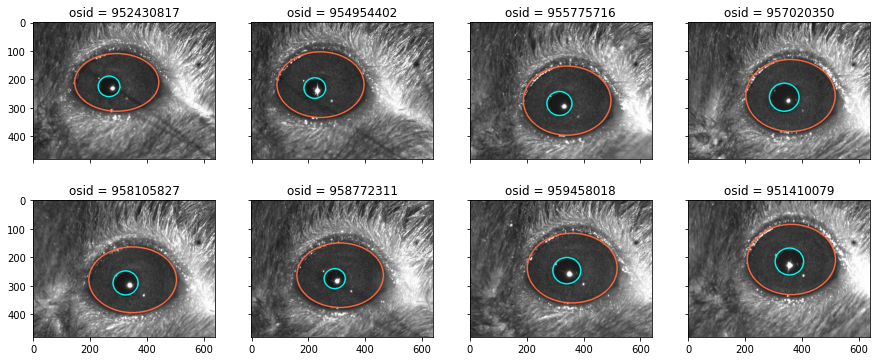

In [4]:
n_cols=4
n_rows = int(np.ceil(len(osids)/4))
fig,ax=plt.subplots(n_rows,n_cols,figsize=(15,3*n_rows),sharex=True,sharey=True)


for ii,osid in enumerate(osids):
    frame = eye_data[osid].get_annotated_frame(10000)
    ax.flatten()[ii].imshow(frame)
    ax.flatten()[ii].set_title('osid = {}'.format(osid))

## For the first session, get the SDK session and eye_tracking object
Unlike the VBA implementation, the SDK requires the ophys_experiment_id as the input

In [11]:
oeids = db.lims_query('select ID from ophys_experiments where ophys_session_id = {}'.format(osids[0]))
oeids

,id
0,953659756
1,953659754
2,953659752
3,953659749
4,953659747
5,953659745
6,953659743
7,953659741


## by default, the 'likely_blinks' are identified as frames where either 1) the eye/pupil fit failed or 2) the z-scored pupil fit exceeds a threshold defined by `eye_tracking_z_threshold`. In addition, `eye_tracking_dilation_frames` frames on either side of frames meeting those conditions are also identified as `likely_blinks`. Together, these parameters have the possibility of filtering out potentially good frames

In [122]:
session = BehaviorOphysSession.from_lims(oeids.iloc[0][0])
session.get_params()

{'eye_tracking_dilation_frames': 2, 'eye_tracking_z_threshold': 3.0}

In [123]:
def plot_10_frames(session,frames):
    fig,ax=plt.subplots(2,5,figsize=(18,7))
    for ii,frame_number in enumerate(frames):
        frame = eye_data[osids[0]].get_annotated_frame(frame_number,pupil=True, eye=True, corneal_reflection=True)
        ax.flatten()[ii].imshow(frame)
        ax.flatten()[ii].set_title('frame = {}'.format(frame_number))
        ax.flatten()[ii].axis('off')
    fig.tight_layout()
    return fig,ax

### Here are 10 frames identified as `likely_blink` frames with the parameters in their default state. 
Note that most are just very dilated pupils, not actual blinks.

<IPython.core.display.Javascript object>


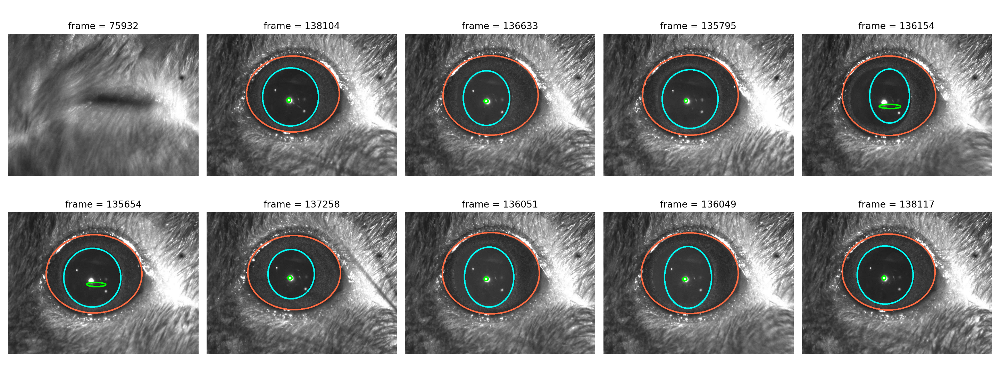

In [124]:
likely_blink_frames = session.eye_tracking.query('likely_blink').sample(10,random_state=0).index.values
fig,ax=plot_10_frames(session,likely_blink_frames)

## and for comparison, here are 10 frames that were not identified as likely blinks:

<IPython.core.display.Javascript object>


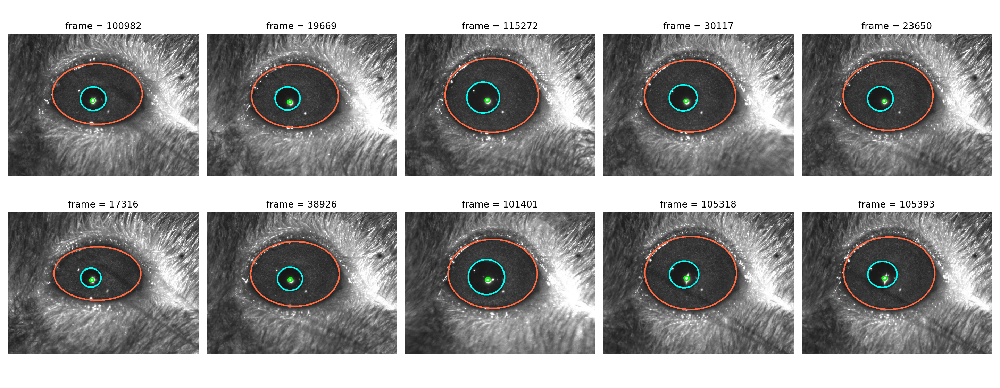

In [125]:
not_likely_blink_frames = session.eye_tracking.query('not likely_blink').sample(10,random_state=0).index.values
fig,ax=plot_10_frames(session,not_likely_blink_frames)

## we can make the likely blink algorithm more conservative by increasing the default z-score threshold and turning off dilation (which identifies adjacent frames)
The algorithm is still picking up some frames where the eye and pupil fits are reasonable, but only the CR fits are bad

In [126]:
session = BehaviorOphysSession.from_lims(oeids.iloc[0][0])
session.set_params(eye_tracking_dilation_frames =0, eye_tracking_z_threshold= 10.0)
session

<IPython.core.display.Javascript object>


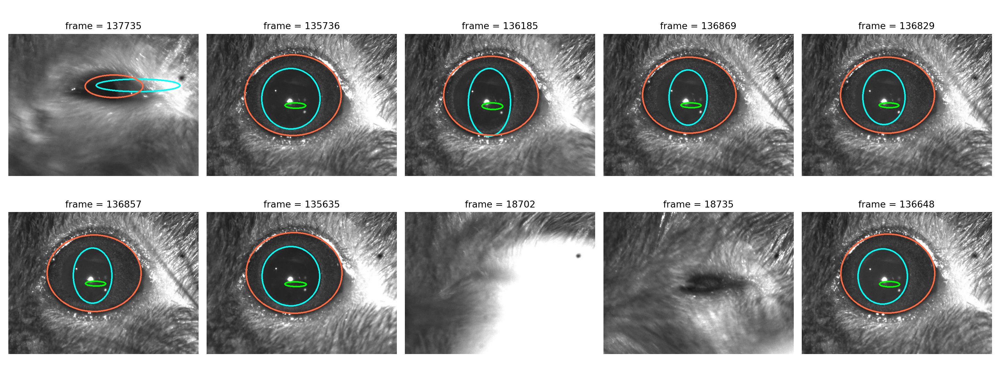

In [127]:
likely_blink_frames = session.eye_tracking.query('likely_blink').sample(10,random_state=0).index.values
fig,ax=plot_10_frames(session,likely_blink_frames)

## we can make the likely blink algorithm even more conservative by turning off z-score thresholding (setting to np.nan) and turning off dilation (which identifies adjacent frames)
In this case, the algorithm will only pick up frames where one of the fits is NaN. These are universally bad frames

In [128]:
session = BehaviorOphysSession.from_lims(oeids.iloc[0][0])
session.set_params(eye_tracking_dilation_frames =0, eye_tracking_z_threshold= np.inf)
session

<IPython.core.display.Javascript object>


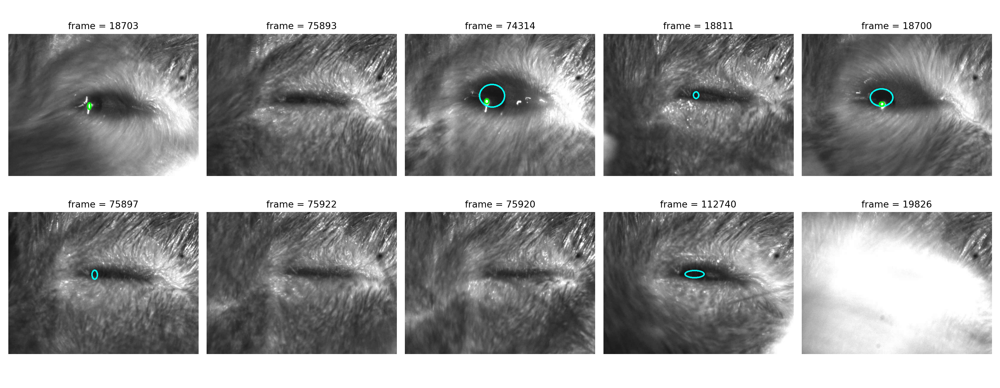

In [129]:
likely_blink_frames = session.eye_tracking.query('likely_blink').sample(10,random_state=0).index.values
fig,ax=plot_10_frames(session,likely_blink_frames)

## Here are plots of the z-scored timeseries for reference
The corneal reflection is the least reliable fit, with many z-scored values in the 10-20 range. That explains the frames identified as likely blinks even with the z-score threshold at 10

In [130]:
session.eye_tracking['z-scored_pupil'] = stats.zscore(session.eye_tracking['pupil_area'].fillna(session.eye_tracking['pupil_area'].mean()))
session.eye_tracking['z-scored_eye'] = stats.zscore(session.eye_tracking['eye_area'].fillna(session.eye_tracking['eye_area'].mean()))
session.eye_tracking['z-scored_cr'] = stats.zscore(session.eye_tracking['cr_area'].fillna(session.eye_tracking['cr_area'].mean()))

<IPython.core.display.Javascript object>


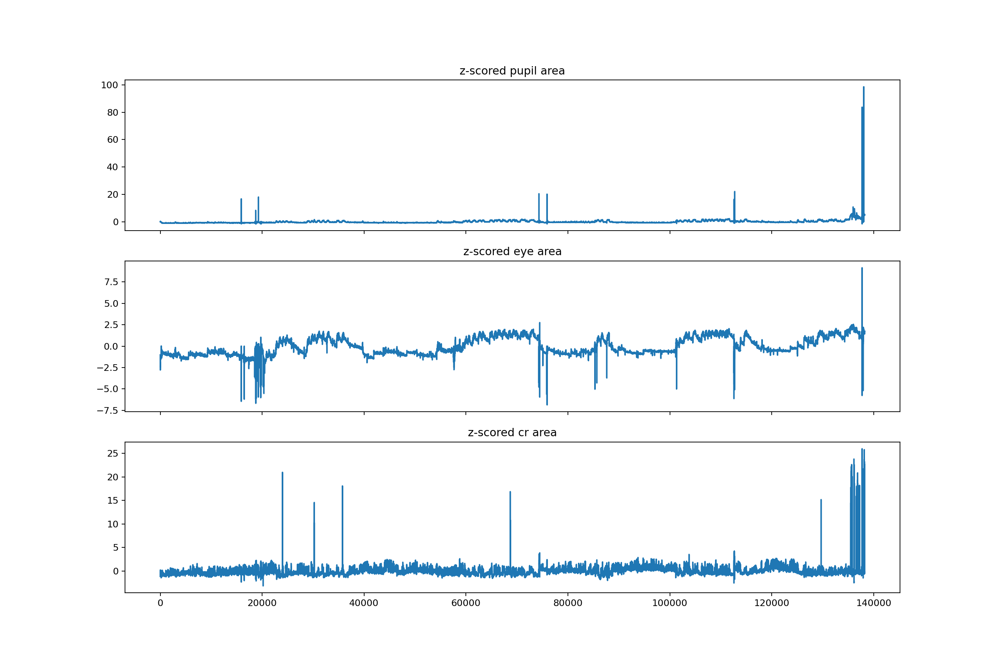

In [132]:
fig,ax=plt.subplots(3,1,figsize=(15,10),sharex=True)
for ii,var in enumerate(['pupil','eye','cr']):
    ax[ii].plot(
        session.eye_tracking['z-scored_{}'.format(var)]
    )
    ax[ii].set_title('z-scored {} area'.format(var))